In [89]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import string
from wordcloud import WordCloud
from IPython.display import Audio, display
import librosa
import librosa.display
import warnings
warnings.filterwarnings('ignore')

In [2]:
import nltk
from nltk.corpus import stopwords

nltk.download('stopwords')
sw_eng = stopwords.words('english')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\andre\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [41]:
df = pd.read_csv("minds14-all-train.csv")

In [42]:
df.head()

,path,audio,transcription,english_transcription,intent_class,lang_id,intent_label,lang,array_len
0,C:\Users\andre\.cache\huggingface\datasets\dow...,{'path': 'C:\\Users\\andre\\.cache\\huggingfac...,Hallo kurze frage ich wollte nur wissen warum ...,Hello short question I just wanted to know why...,6,1,card_issues,de-DE,106880
1,C:\Users\andre\.cache\huggingface\datasets\dow...,{'path': 'C:\\Users\\andre\\.cache\\huggingfac...,hi I am traveling in Italy right now and I'm j...,hi I am traveling in Italy right now and I'm j...,0,4,abroad,en-US,73561
2,C:\Users\andre\.cache\huggingface\datasets\dow...,{'path': 'C:\\Users\\andre\\.cache\\huggingfac...,nein noch nicht,no not yet,0,1,abroad,de-DE,29600
3,C:\Users\andre\.cache\huggingface\datasets\dow...,{'path': 'C:\\Users\\andre\\.cache\\huggingfac...,Почему моя карта не работает,Why is my card not working,6,12,card_issues,ru-RU,24520
4,C:\Users\andre\.cache\huggingface\datasets\dow...,{'path': 'C:\\Users\\andre\\.cache\\huggingfac...,я получила эсэмэску потому что пытаюсь заплати...,I received a text message because I am trying ...,10,12,high_value_payment,ru-RU,59443


In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1652 entries, 0 to 1651
Data columns (total 9 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   path                   1652 non-null   object
 1   audio                  1652 non-null   object
 2   transcription          1652 non-null   object
 3   english_transcription  1652 non-null   object
 4   intent_class           1652 non-null   int64 
 5   lang_id                1652 non-null   int64 
 6   intent_label           1652 non-null   object
 7   lang                   1652 non-null   object
 8   array_len              1652 non-null   int64 
dtypes: int64(3), object(6)
memory usage: 116.3+ KB


In [44]:
# Apply lowercase then remoe punctuation
df["english_transcription_preprocessed"] = df["english_transcription"].str.lower().str.translate(str.maketrans('', '', string.punctuation))

In [45]:
df.head()

,path,audio,transcription,english_transcription,intent_class,lang_id,intent_label,lang,array_len,english_transcription_preprocessed
0,C:\Users\andre\.cache\huggingface\datasets\dow...,{'path': 'C:\\Users\\andre\\.cache\\huggingfac...,Hallo kurze frage ich wollte nur wissen warum ...,Hello short question I just wanted to know why...,6,1,card_issues,de-DE,106880,hello short question i just wanted to know why...
1,C:\Users\andre\.cache\huggingface\datasets\dow...,{'path': 'C:\\Users\\andre\\.cache\\huggingfac...,hi I am traveling in Italy right now and I'm j...,hi I am traveling in Italy right now and I'm j...,0,4,abroad,en-US,73561,hi i am traveling in italy right now and im ju...
2,C:\Users\andre\.cache\huggingface\datasets\dow...,{'path': 'C:\\Users\\andre\\.cache\\huggingfac...,nein noch nicht,no not yet,0,1,abroad,de-DE,29600,no not yet
3,C:\Users\andre\.cache\huggingface\datasets\dow...,{'path': 'C:\\Users\\andre\\.cache\\huggingfac...,Почему моя карта не работает,Why is my card not working,6,12,card_issues,ru-RU,24520,why is my card not working
4,C:\Users\andre\.cache\huggingface\datasets\dow...,{'path': 'C:\\Users\\andre\\.cache\\huggingfac...,я получила эсэмэску потому что пытаюсь заплати...,I received a text message because I am trying ...,10,12,high_value_payment,ru-RU,59443,i received a text message because i am trying ...


# Statistics

## Intent Class Distribution

Text(0.5, 1.0, 'Counts of Intents Train')

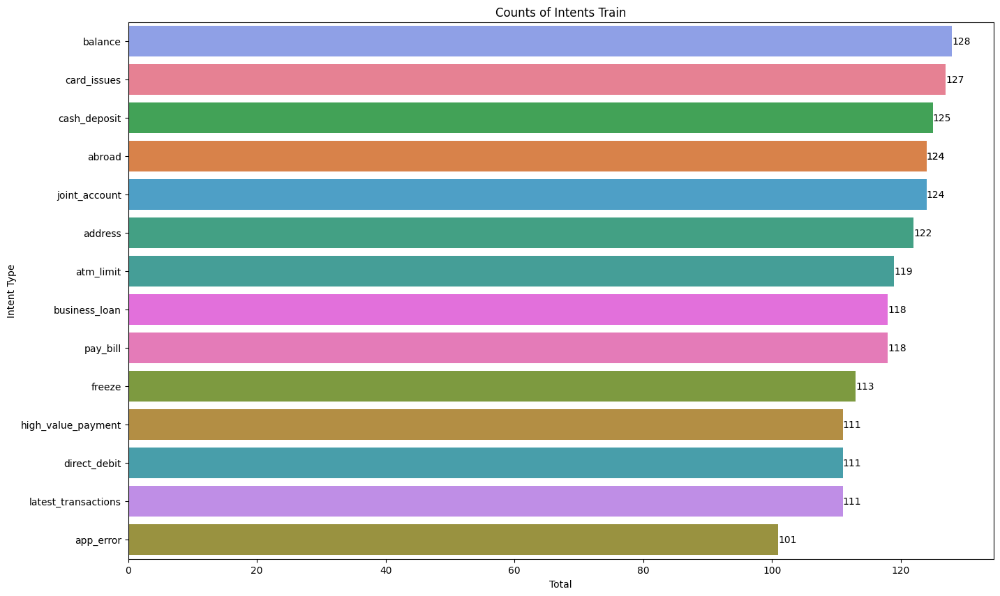

In [46]:
fig, axs= plt.subplots(1,1, figsize=(16,10))

sns.countplot(data=df, y='intent_label', hue=df['intent_label'], ax=axs,order = df['intent_label'].value_counts().index)
axs.set_xlabel('Total')
axs.set_ylabel('Intent Type')
for i in range(len(df['intent_label'].value_counts().index)):
    axs.bar_label(axs.containers[i])
axs.bar_label(axs.containers[1])
axs.set_title('Counts of Intents Train')

## Language Class Distribution

Text(0.5, 1.0, 'Counts of Language Train')

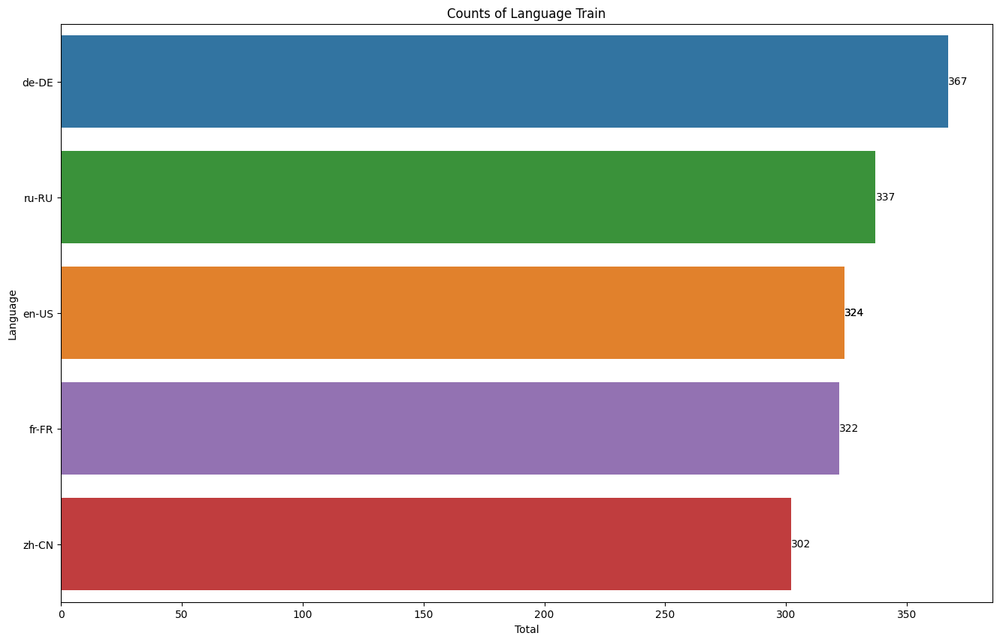

In [47]:
fig, axs= plt.subplots(1,1, figsize=(16,10))

sns.countplot(data=df, y='lang', hue=df['lang'], ax=axs,order = df['lang'].value_counts().index)
axs.set_xlabel('Total')
axs.set_ylabel('Language')
for i in range(len(df['lang'].value_counts().index)):
    axs.bar_label(axs.containers[i])
axs.bar_label(axs.containers[1])
axs.set_title('Counts of Language Train')

## Audio Lengths Distribution

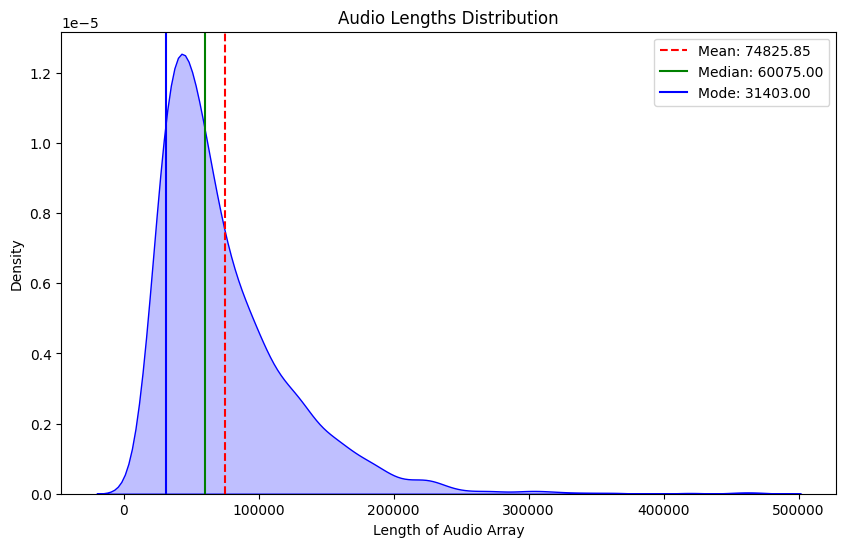

In [48]:
# Compute central tendency values
mean_len = df['array_len'].mean()
median_len = df['array_len'].median()
mode_len = df['array_len'].mode()[0]

# Plot KDE with central tendency values
plt.figure(figsize=(10, 6))
sns.kdeplot(df['array_len'], shade=True, color="blue")

# Add lines for mean, median, and mode
plt.axvline(mean_len, color='r', linestyle='--', label=f'Mean: {mean_len:.2f}')
plt.axvline(median_len, color='g', linestyle='-', label=f'Median: {median_len:.2f}')
plt.axvline(mode_len, color='b', linestyle='-', label=f'Mode: {mode_len:.2f}')

# Add labels and title
plt.xlabel('Length of Audio Array')
plt.ylabel('Density')
plt.title('Audio Lengths Distribution')
plt.legend()
plt.show()

## English Transcription Lengths Distribution

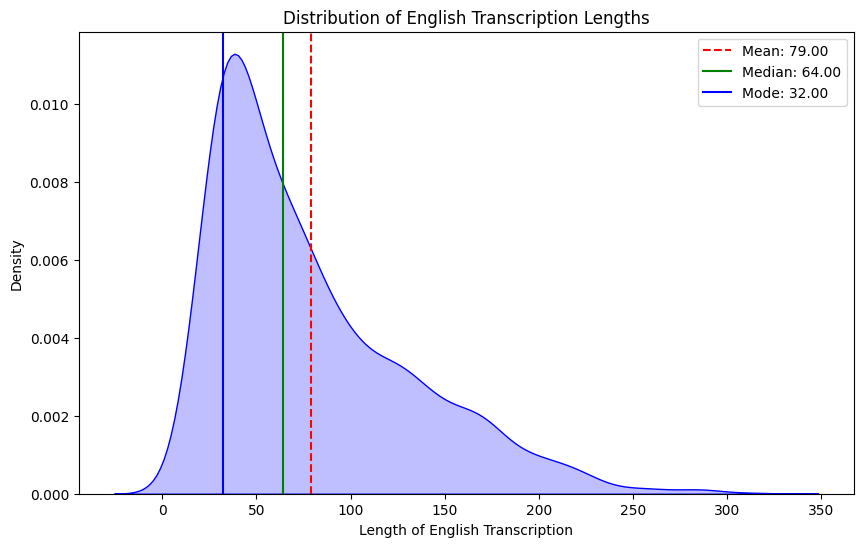

In [49]:
df['en_transcription_length'] = df['english_transcription_preprocessed'].apply(len)

# Hitung nilai central tendency
mean_len = df['en_transcription_length'].mean()
median_len = df['en_transcription_length'].median()
mode_len = df['en_transcription_length'].mode()[0]

# Plot KDE dengan nilai central tendency
plt.figure(figsize=(10, 6))
sns.kdeplot(df['en_transcription_length'], shade=True, color="blue")

# Tambahkan garis untuk mean, median, dan mode
plt.axvline(mean_len, color='r', linestyle='--', label=f'Mean: {mean_len:.2f}')
plt.axvline(median_len, color='g', linestyle='-', label=f'Median: {median_len:.2f}')
plt.axvline(mode_len, color='b', linestyle='-', label=f'Mode: {mode_len:.2f}')

# Tambahkan label dan judul
plt.xlabel('Length of English Transcription')
plt.ylabel('Density')
plt.title('Distribution of English Transcription Lengths')
plt.legend()

## English Transcription Word Count Distribution

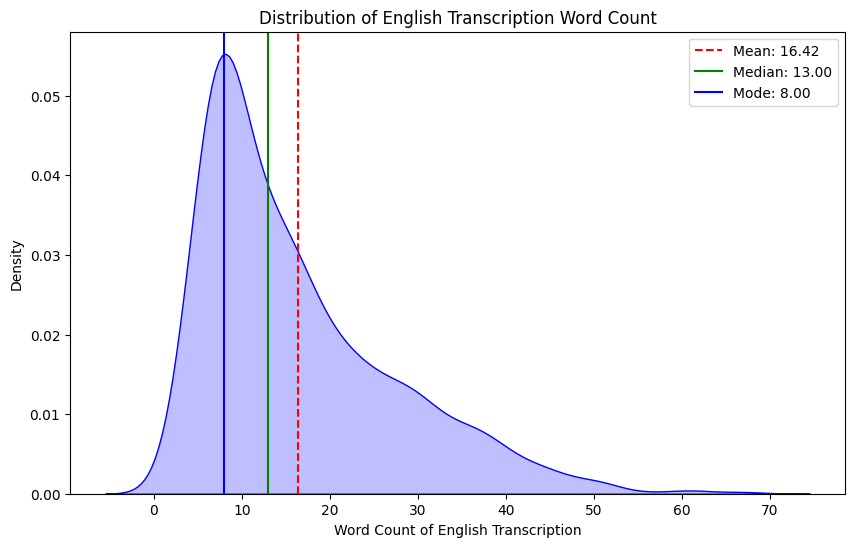

In [50]:
# Number of words appearing in each sentence
df['en_transcription_word_count'] = df['english_transcription_preprocessed'].str.split().apply(len)

# Hitung nilai central tendency
mean_len = df['en_transcription_word_count'].mean()
median_len = df['en_transcription_word_count'].median()
mode_len = df['en_transcription_word_count'].mode()[0]

# Plot KDE dengan nilai central tendency
plt.figure(figsize=(10, 6))
sns.kdeplot(df['en_transcription_word_count'], shade=True, color="blue")

# Tambahkan garis untuk mean, median, dan mode
plt.axvline(mean_len, color='r', linestyle='--', label=f'Mean: {mean_len:.2f}')
plt.axvline(median_len, color='g', linestyle='-', label=f'Median: {median_len:.2f}')
plt.axvline(mode_len, color='b', linestyle='-', label=f'Mode: {mode_len:.2f}')

# Tambahkan label dan judul
plt.xlabel('Word Count of English Transcription')
plt.ylabel('Density')
plt.title('Distribution of English Transcription Word Count')
plt.legend()

# Stopwords

In [51]:
english_transcription = df['english_transcription_preprocessed'].values.tolist()

In [52]:
from collections import defaultdict
dic=defaultdict(int)
for words in english_transcription:
    for word in words.split():
        if word in sw_eng:
            dic[word]+=1

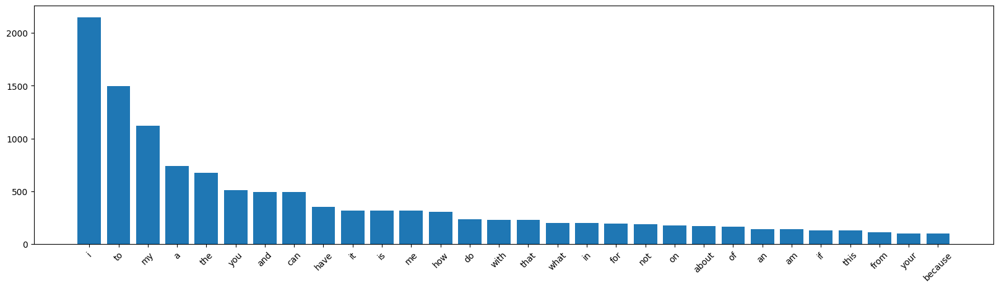

In [53]:
# Plot top stopwords

top=sorted(dic.items(), key=lambda x:x[1],reverse=True)[:30]
x,y=zip(*top)
fig = plt.figure(figsize=(20, 5))
plt.bar(x,y)
plt.xticks(rotation=45)
plt.show()

# Ngram analysis

In [54]:
from sklearn.feature_extraction.text import CountVectorizer

In [55]:
def get_top_ngram(corpus, n=None):
    vec = CountVectorizer(ngram_range=(n, n)).fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0)
    words_freq = [(word, sum_words[0, idx])
                  for word, idx in vec.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:10]

<Axes: >

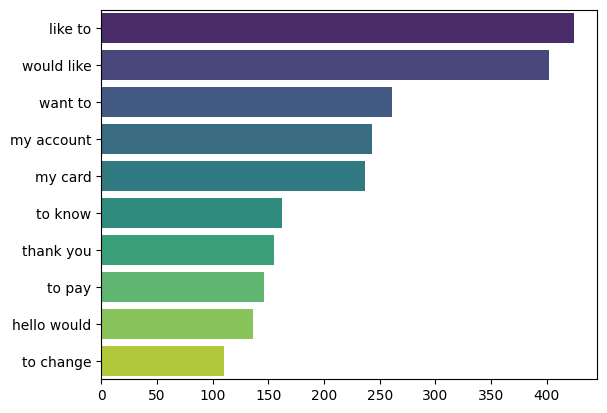

In [56]:
top_n_bigrams=get_top_ngram(df["english_transcription_preprocessed"].dropna(),2)[:10]
x,y=map(list,zip(*top_n_bigrams))
sns.barplot(x=y,y=x, palette="viridis")

<Axes: >

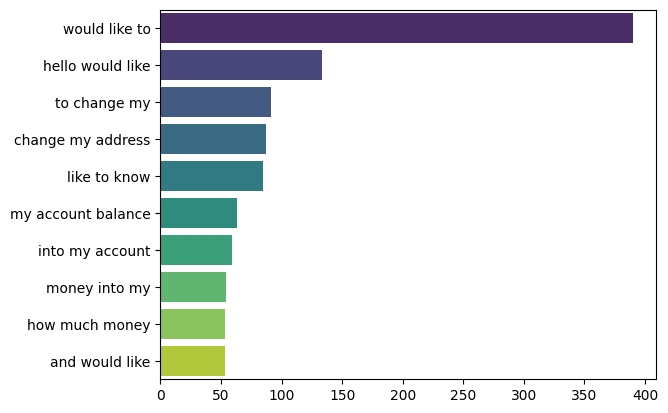

In [57]:
top_tri_grams=get_top_ngram(df["english_transcription_preprocessed"].dropna(),n=3)
x,y=map(list,zip(*top_tri_grams))
sns.barplot(x=y,y=x, palette="viridis")

# Wordcloud

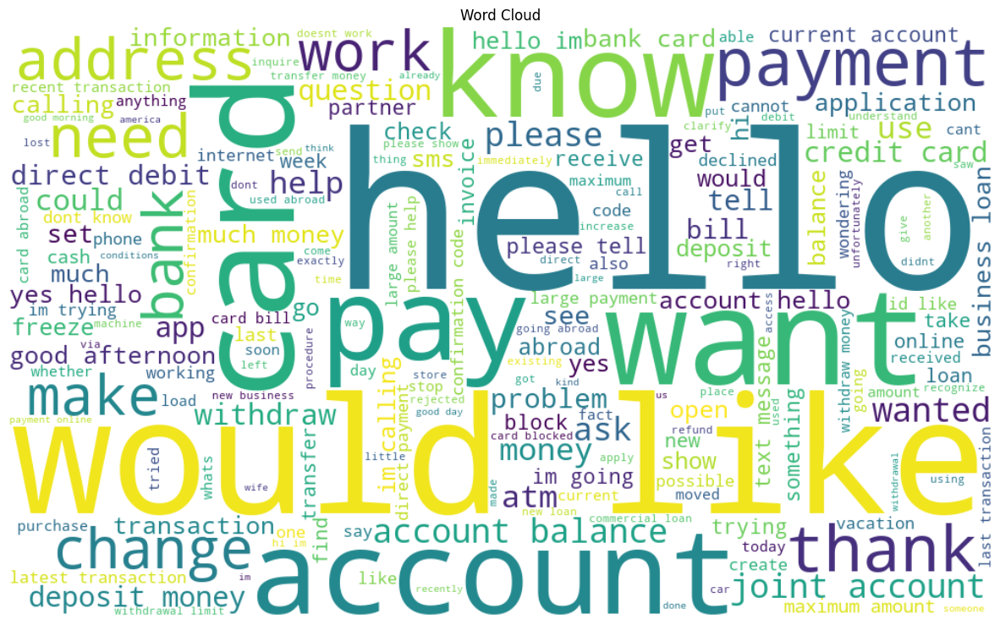

In [58]:
# Combine all the reviews into a single string
all_word = ' '.join(df['english_transcription_preprocessed'].dropna())

# Generate the word cloud
wordcloud = WordCloud(width=1000, height=600, background_color='white', stopwords = sw_eng).generate(all_word)

# Display the word cloud using matplotlib
plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud')
plt.axis('off')
plt.show()

In [59]:
df.intent_label.value_counts()

intent_label
balance                128
card_issues            127
cash_deposit           125
abroad                 124
joint_account          124
address                122
atm_limit              119
business_loan          118
pay_bill               118
freeze                 113
high_value_payment     111
direct_debit           111
latest_transactions    111
app_error              101
Name: count, dtype: int64

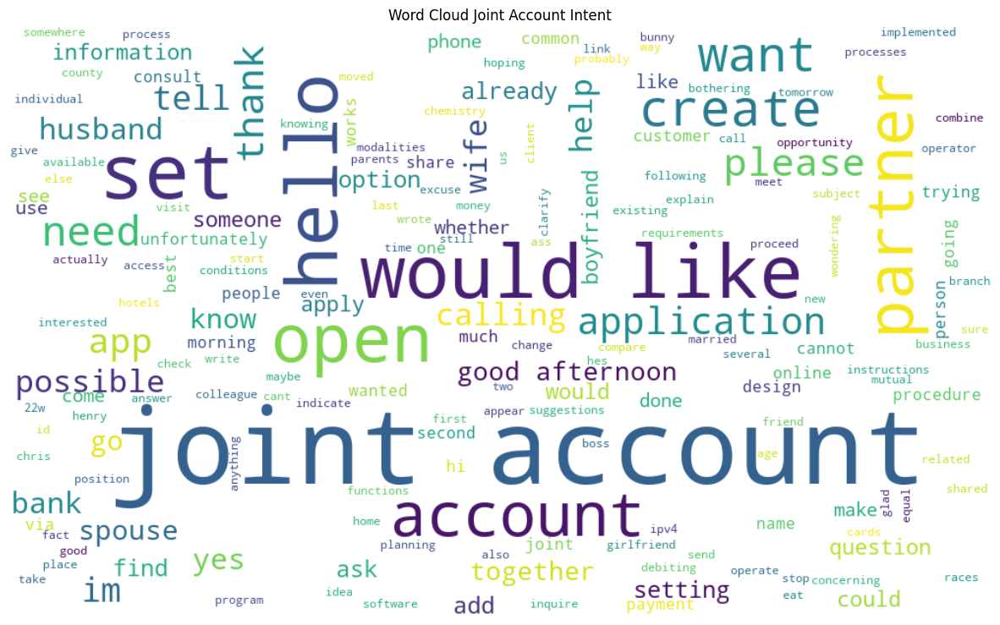

In [60]:
# Combine all the reviews into a single string
df_intent = df[df['intent_label'] == 'joint_account']
all_word = ' '.join(df_intent['english_transcription_preprocessed'].dropna())

# Generate the word cloud
wordcloud = WordCloud(width=1000, height=600, background_color='white', stopwords = sw_eng).generate(all_word)

# Display the word cloud using matplotlib
plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud Joint Account Intent')
plt.axis('off')
plt.show()

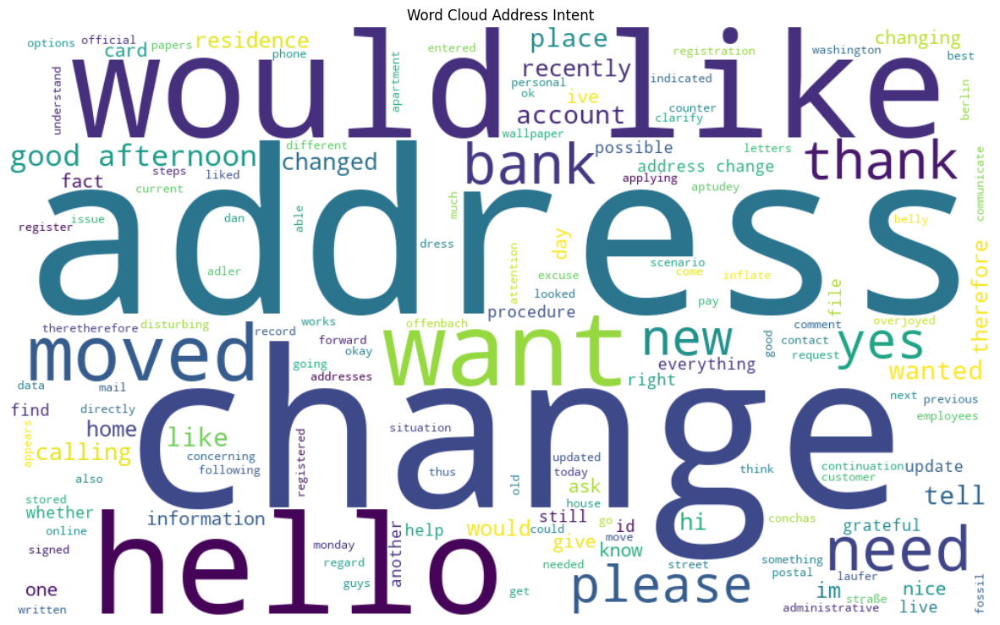

In [61]:
# Combine all the reviews into a single string
df_intent = df[df['intent_label'] == 'address']
all_word = ' '.join(df_intent['english_transcription_preprocessed'].dropna())

# Generate the word cloud
wordcloud = WordCloud(width=1000, height=600, background_color='white', stopwords = sw_eng).generate(all_word)

# Display the word cloud using matplotlib
plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud Address Intent')
plt.axis('off')
plt.show()

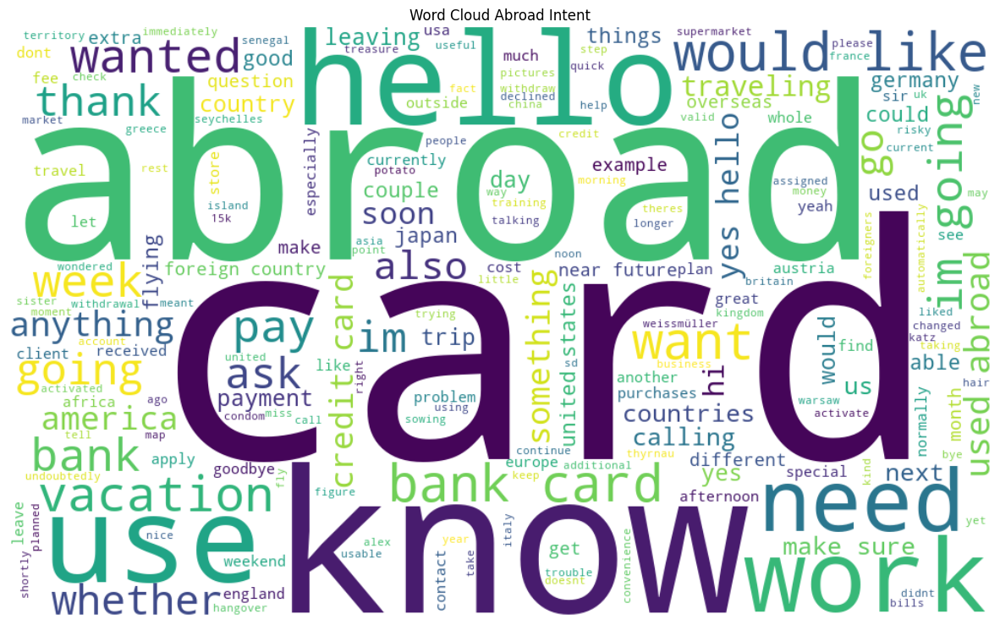

In [62]:
# Combine all the reviews into a single string
df_intent = df[df['intent_label'] == 'abroad']
all_word = ' '.join(df_intent['english_transcription_preprocessed'].dropna())

# Generate the word cloud
wordcloud = WordCloud(width=1000, height=600, background_color='white', stopwords = sw_eng).generate(all_word)

# Display the word cloud using matplotlib
plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud Abroad Intent')
plt.axis('off')
plt.show()

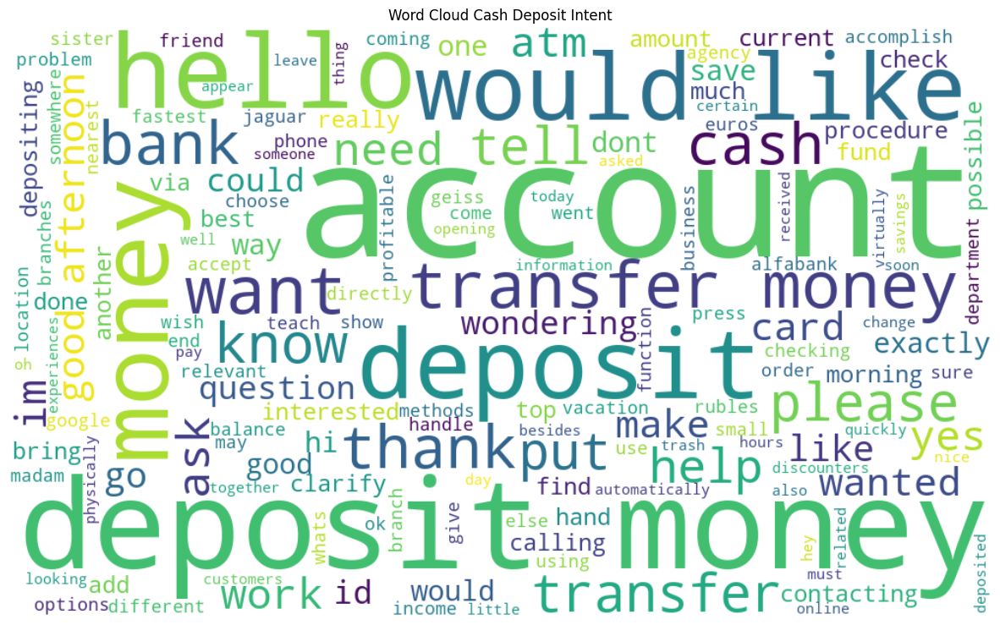

In [63]:
# Combine all the reviews into a single string
df_intent = df[df['intent_label'] == 'cash_deposit']
all_word = ' '.join(df_intent['english_transcription_preprocessed'].dropna())

# Generate the word cloud
wordcloud = WordCloud(width=1000, height=600, background_color='white', stopwords = sw_eng).generate(all_word)

# Display the word cloud using matplotlib
plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud Cash Deposit Intent')
plt.axis('off')
plt.show()

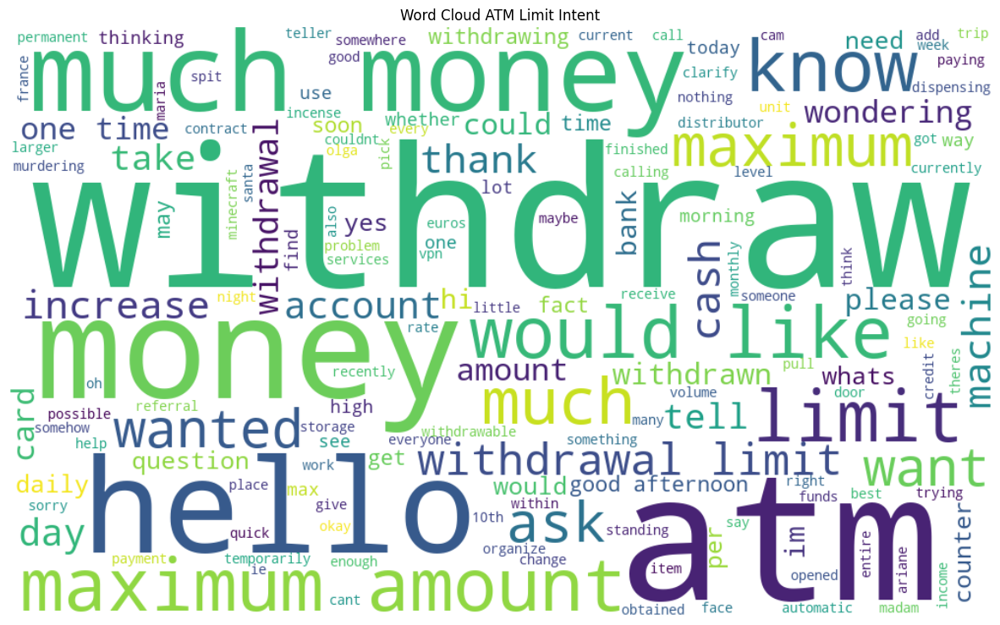

In [64]:
# Combine all the reviews into a single string
df_intent = df[df['intent_label'] == 'atm_limit']
all_word = ' '.join(df_intent['english_transcription_preprocessed'].dropna())

# Generate the word cloud
wordcloud = WordCloud(width=1000, height=600, background_color='white', stopwords = sw_eng).generate(all_word)

# Display the word cloud using matplotlib
plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud ATM Limit Intent')
plt.axis('off')
plt.show()

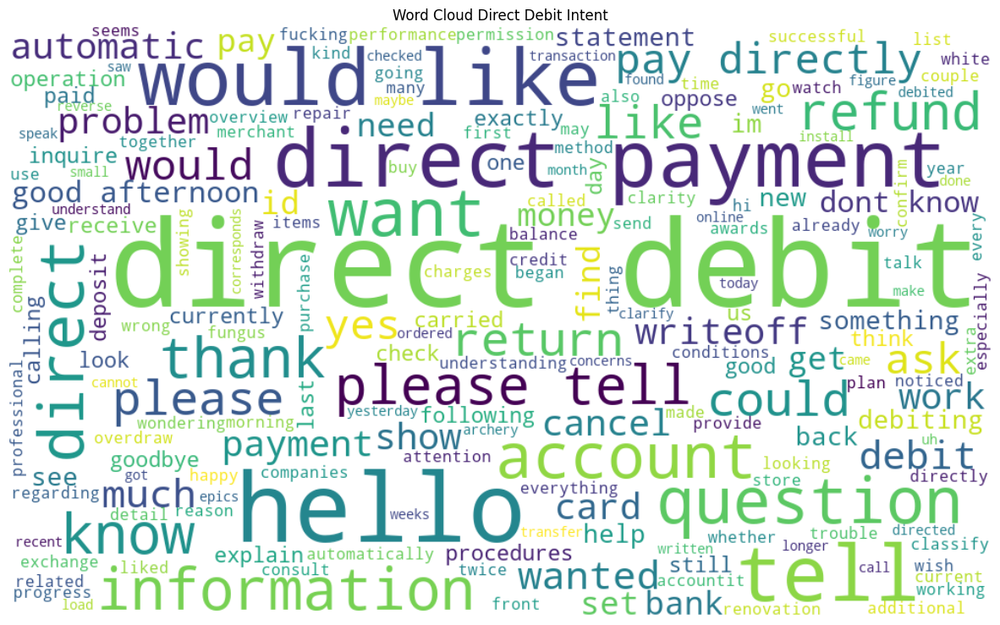

In [65]:
# Combine all the reviews into a single string
df_intent = df[df['intent_label'] == 'direct_debit']
all_word = ' '.join(df_intent['english_transcription_preprocessed'].dropna())

# Generate the word cloud
wordcloud = WordCloud(width=1000, height=600, background_color='white', stopwords = sw_eng).generate(all_word)

# Display the word cloud using matplotlib
plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud Direct Debit Intent')
plt.axis('off')
plt.show()

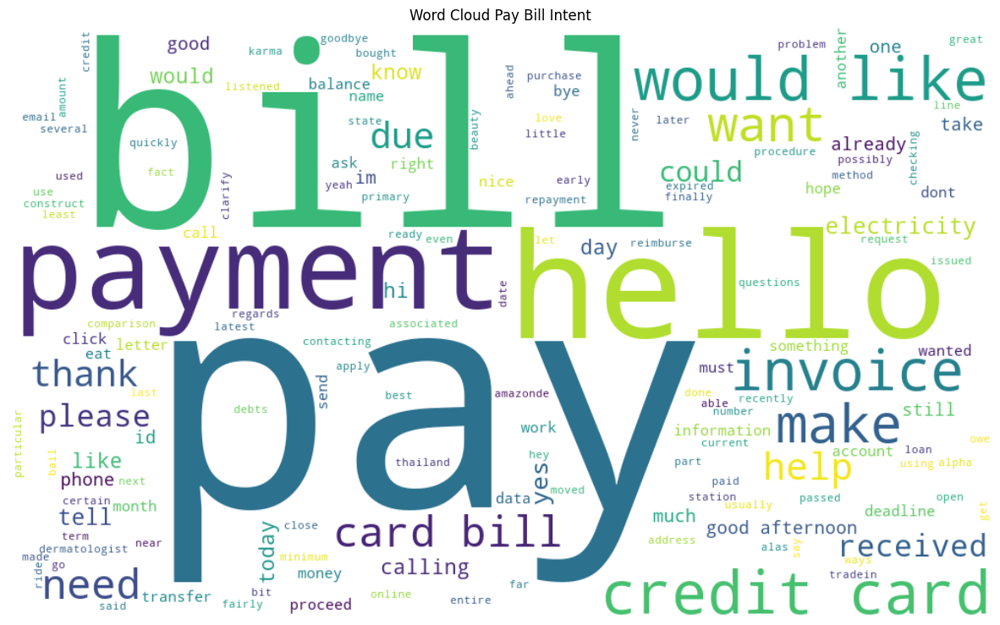

In [66]:
# Combine all the reviews into a single string
df_intent = df[df['intent_label'] == 'pay_bill']
all_word = ' '.join(df_intent['english_transcription_preprocessed'].dropna())

# Generate the word cloud
wordcloud = WordCloud(width=1000, height=600, background_color='white', stopwords = sw_eng).generate(all_word)

# Display the word cloud using matplotlib
plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud Pay Bill Intent')
plt.axis('off')
plt.show()

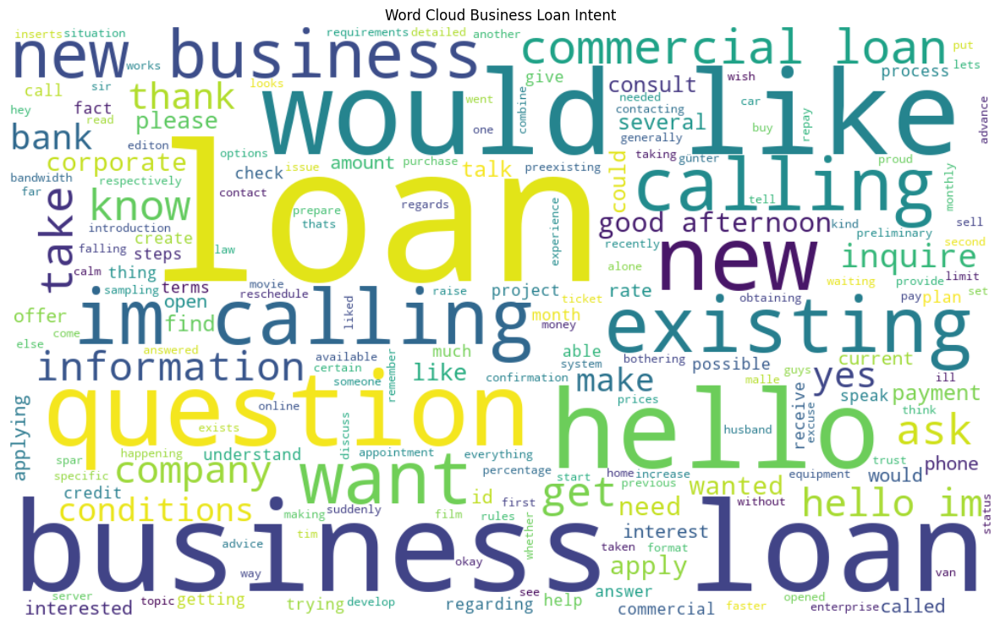

In [67]:
# Combine all the reviews into a single string
df_intent = df[df['intent_label'] == 'business_loan']
all_word = ' '.join(df_intent['english_transcription_preprocessed'].dropna())

# Generate the word cloud
wordcloud = WordCloud(width=1000, height=600, background_color='white', stopwords = sw_eng).generate(all_word)

# Display the word cloud using matplotlib
plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud Business Loan Intent')
plt.axis('off')
plt.show()

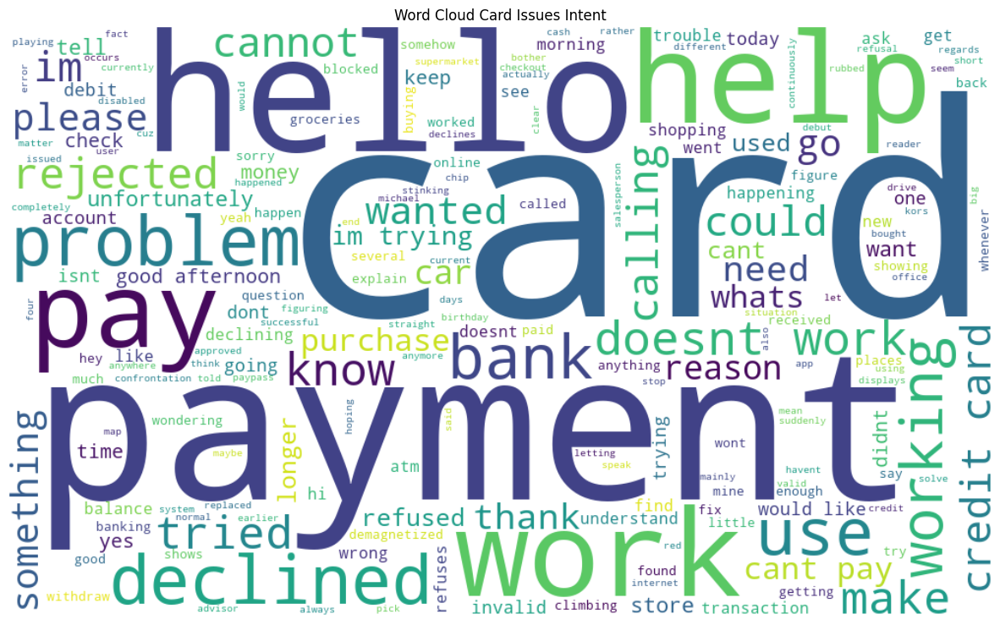

In [68]:
# Combine all the reviews into a single string
df_intent = df[df['intent_label'] == 'card_issues']
all_word = ' '.join(df_intent['english_transcription_preprocessed'].dropna())

# Generate the word cloud
wordcloud = WordCloud(width=1000, height=600, background_color='white', stopwords = sw_eng).generate(all_word)

# Display the word cloud using matplotlib
plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud Card Issues Intent')
plt.axis('off')
plt.show()

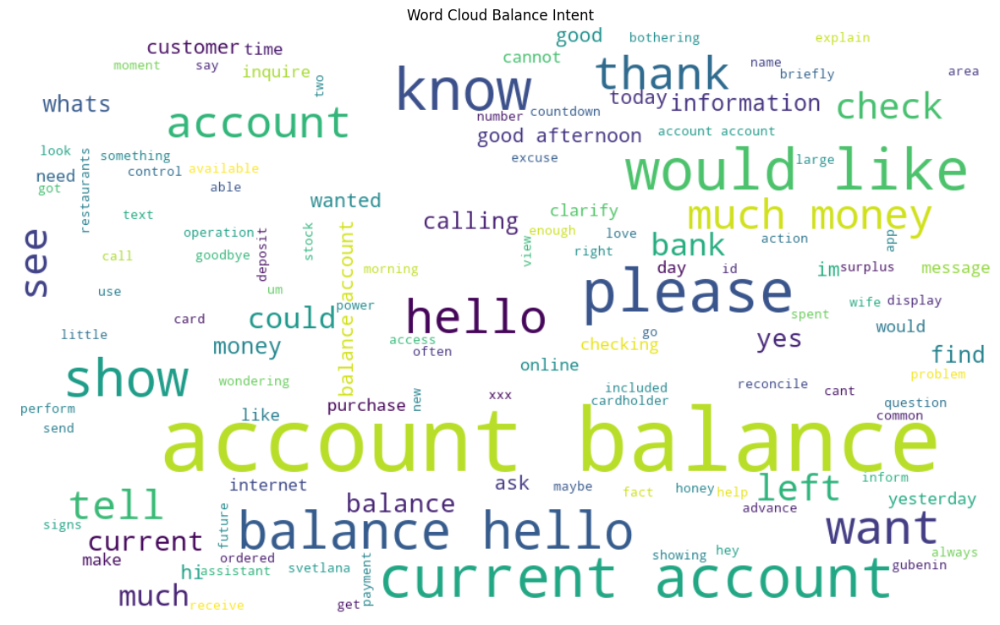

In [69]:
# Combine all the reviews into a single string
df_intent = df[df['intent_label'] == 'balance']
all_word = ' '.join(df_intent['english_transcription_preprocessed'].dropna())

# Generate the word cloud
wordcloud = WordCloud(width=1000, height=600, background_color='white', stopwords = sw_eng).generate(all_word)

# Display the word cloud using matplotlib
plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud Balance Intent')
plt.axis('off')
plt.show()

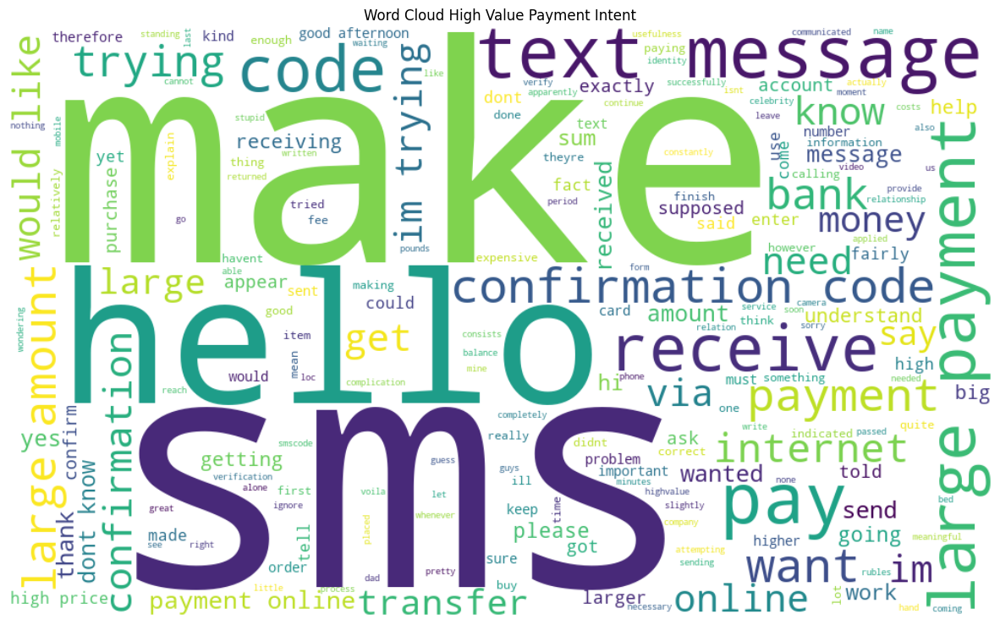

In [70]:
# Combine all the reviews into a single string
df_intent = df[df['intent_label'] == 'high_value_payment']
all_word = ' '.join(df_intent['english_transcription_preprocessed'].dropna())

# Generate the word cloud
wordcloud = WordCloud(width=1000, height=600, background_color='white', stopwords = sw_eng).generate(all_word)

# Display the word cloud using matplotlib
plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud High Value Payment Intent')
plt.axis('off')
plt.show()

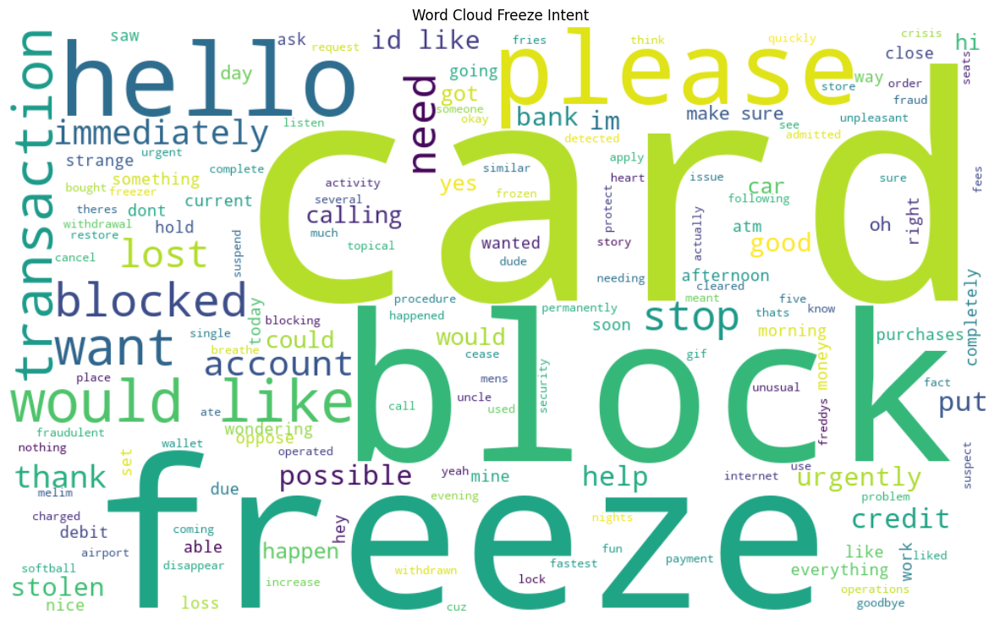

In [71]:
# Combine all the reviews into a single string
df_intent = df[df['intent_label'] == 'freeze']
all_word = ' '.join(df_intent['english_transcription_preprocessed'].dropna())

# Generate the word cloud
wordcloud = WordCloud(width=1000, height=600, background_color='white', stopwords = sw_eng).generate(all_word)

# Display the word cloud using matplotlib
plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud Freeze Intent')
plt.axis('off')
plt.show()

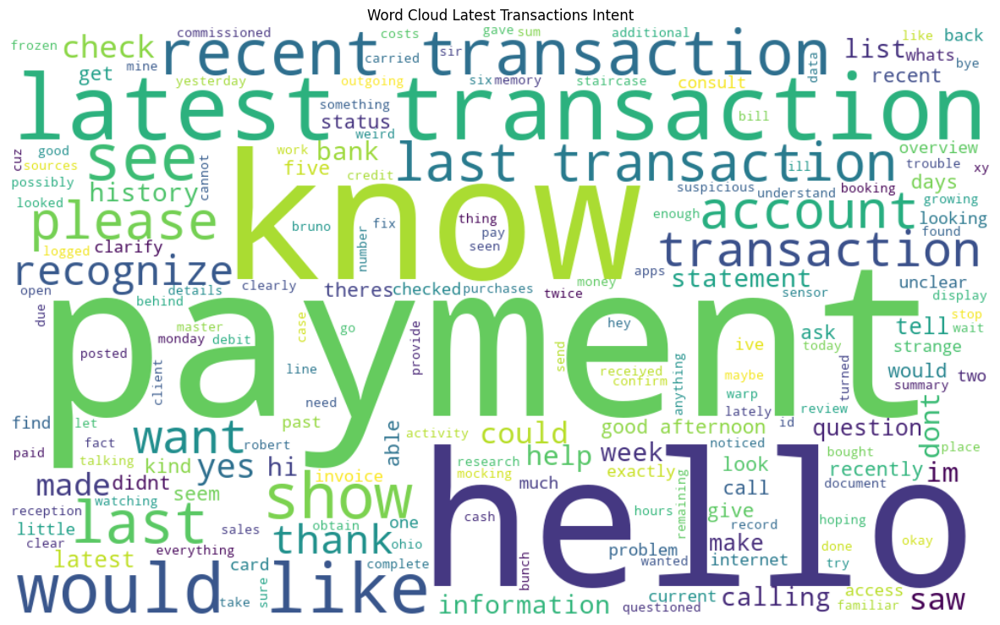

In [72]:
# Combine all the reviews into a single string
df_intent = df[df['intent_label'] == 'latest_transactions']
all_word = ' '.join(df_intent['english_transcription_preprocessed'].dropna())

# Generate the word cloud
wordcloud = WordCloud(width=1000, height=600, background_color='white', stopwords = sw_eng).generate(all_word)

# Display the word cloud using matplotlib
plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud Latest Transactions Intent')
plt.axis('off')
plt.show()

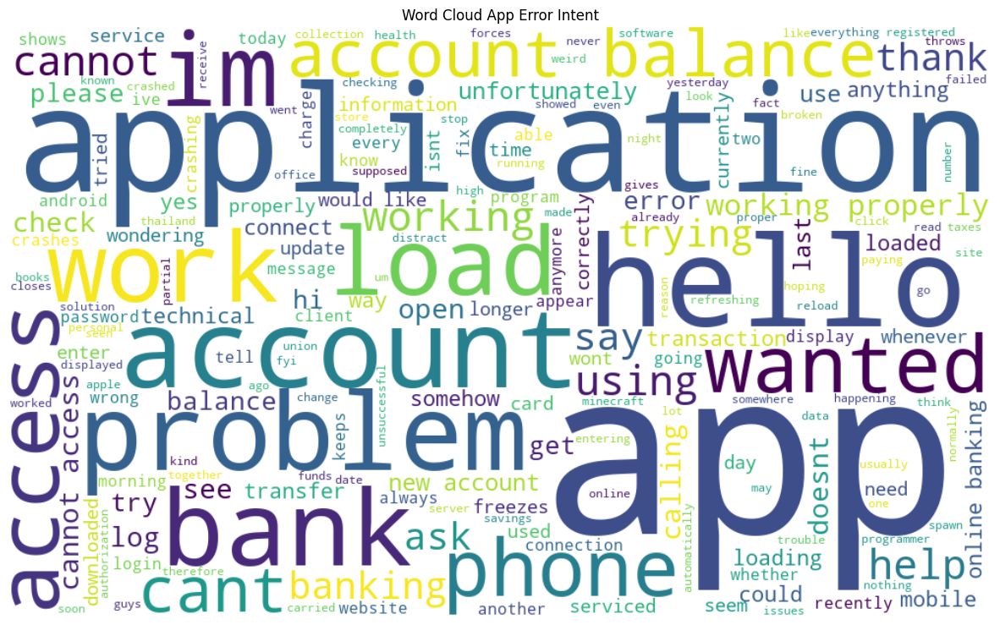

In [73]:
# Combine all the reviews into a single string
df_intent = df[df['intent_label'] == 'app_error']
all_word = ' '.join(df_intent['english_transcription_preprocessed'].dropna())

# Generate the word cloud
wordcloud = WordCloud(width=1000, height=600, background_color='white', stopwords = sw_eng).generate(all_word)

# Display the word cloud using matplotlib
plt.figure(figsize=(15, 12))
plt.imshow(wordcloud, interpolation='bilinear')
plt.title('Word Cloud App Error Intent')
plt.axis('off')
plt.show()

# Audio Sample Each Language

In [80]:
df.lang.unique()

array(['de-DE', 'en-US', 'ru-RU', 'zh-CN', 'fr-FR'], dtype=object)

In [88]:
for i in df.lang.unique():
    print(i)
    for j in range(3):
        print(np.array(df[df['lang']==i].transcription)[j])
        display(Audio(np.array(df[df['lang']==i].path)[j]))

de-DE
Hallo kurze frage ich wollte nur wissen warum meine Karte nicht funktioniert hat und ich war heute morgen einkaufen und hat nicht mehr funktioniert


nein noch nicht


ich möchte gerne ein Gemeinschaftskonto einrichten


en-US
hi I am traveling in Italy right now and I'm just trying to figure out if my


your mobile app isn't working


freeze my card


ru-RU
Почему моя карта не работает


я получила эсэмэску потому что пытаюсь заплатить большую сумму


Добрый день У меня возникла проблема Я пытаюсь оплатить крупную заказ через интернет и мне приходят эсэмэски с кодами но ни один из них не работает


zh-CN
我可以存钱吗如何将款项转入账户我可以在哪里同款


我想要更改我办理银行卡时输入的个人地址


经线是我最新的一笔交易所有一笔不清楚来源的付款的款项是的我亲我知道我的款项


fr-FR
pouvez-vous geler ma ma carte s'il vous plaît


combien d'argent puis-je retirer au guichet automatique est-ce qu'il y a moyen de l'augmenter


Bonjour je m'interroge sur les compagnies qui prélève automatiquement sur mon compte courant


# Audio Plot

In [93]:
from datasets import load_dataset

## Chinese

In [101]:
chinese_dataset = load_dataset("PolyAI/minds14", 'zh-CN', trust_remote_code=True)['train']

In [102]:
chinese_audio = chinese_dataset[0]['audio']['array']
chinese_sampling_rate = chinese_dataset[0]['audio']['sampling_rate']

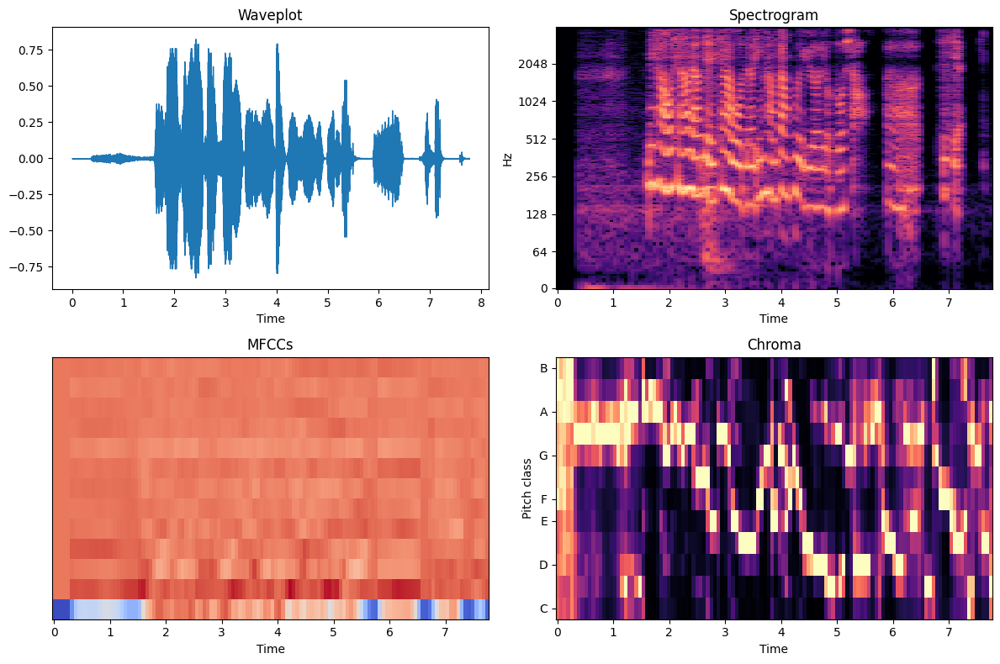

In [103]:
# Convert audio array to float32
chinese_audio = chinese_audio.astype(np.float32)

# Compute MFCCs and Chroma
mfccs = librosa.feature.mfcc(y=chinese_audio, sr=chinese_sampling_rate, n_mfcc=13)
chroma = librosa.feature.chroma_stft(y=chinese_audio, sr=chinese_sampling_rate)

# Plot Waveplot
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
librosa.display.waveshow(chinese_audio, sr=chinese_sampling_rate)
plt.title('Waveplot')

# Plot Spectrogram
plt.subplot(2, 2, 2)
D = librosa.amplitude_to_db(np.abs(librosa.stft(chinese_audio)), ref=np.max)
librosa.display.specshow(D, sr=chinese_sampling_rate, x_axis='time', y_axis='log')
plt.title('Spectrogram')

# Plot MFCCs
plt.subplot(2, 2, 3)
librosa.display.specshow(mfccs, sr=chinese_sampling_rate, x_axis='time')
plt.title('MFCCs')

# Plot Chroma
plt.subplot(2, 2, 4)
librosa.display.specshow(chroma, sr=chinese_sampling_rate, x_axis='time', y_axis='chroma')
plt.title('Chroma')

plt.tight_layout()
plt.show()

In [104]:
# Putar audio
audio_player_chinese = Audio(data=chinese_audio, rate=chinese_sampling_rate)
display(audio_player_chinese)

## Russian

In [105]:
russian_dataset = load_dataset("PolyAI/minds14", 'ru-RU', trust_remote_code=True)['train']

In [106]:
russian_audio = russian_dataset[0]['audio']['array']
russian_sampling_rate = russian_dataset[0]['audio']['sampling_rate']

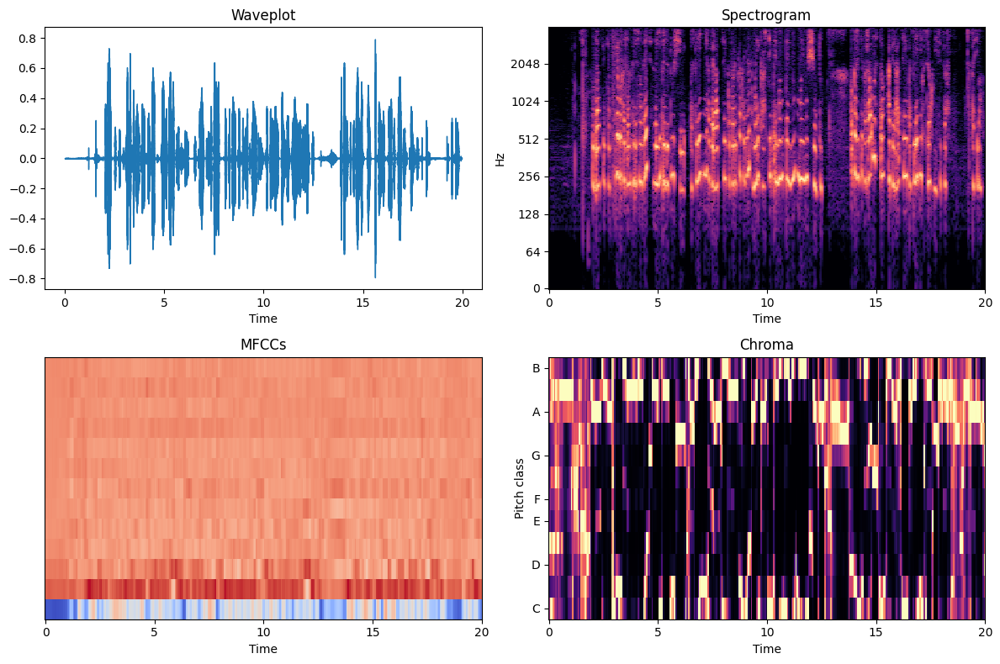

In [107]:
# Convert audio array to float32
russian_audio = russian_audio.astype(np.float32)

# Compute MFCCs and Chroma
mfccs = librosa.feature.mfcc(y=russian_audio, sr=russian_sampling_rate, n_mfcc=13)
chroma = librosa.feature.chroma_stft(y=russian_audio, sr=russian_sampling_rate)

# Plot Waveplot
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
librosa.display.waveshow(russian_audio, sr=russian_sampling_rate)
plt.title('Waveplot')

# Plot Spectrogram
plt.subplot(2, 2, 2)
D = librosa.amplitude_to_db(np.abs(librosa.stft(russian_audio)), ref=np.max)
librosa.display.specshow(D, sr=russian_sampling_rate, x_axis='time', y_axis='log')
plt.title('Spectrogram')

# Plot MFCCs
plt.subplot(2, 2, 3)
librosa.display.specshow(mfccs, sr=russian_sampling_rate, x_axis='time')
plt.title('MFCCs')

# Plot Chroma
plt.subplot(2, 2, 4)
librosa.display.specshow(chroma, sr=russian_sampling_rate, x_axis='time', y_axis='chroma')
plt.title('Chroma')

plt.tight_layout()
plt.show()

In [108]:
# Putar audio
audio_player_russian = Audio(data=russian_audio, rate=russian_sampling_rate)
display(audio_player_russian)

## French

In [109]:
french_dataset = load_dataset("PolyAI/minds14", 'fr-FR', trust_remote_code=True)['train']

In [110]:
french_audio = french_dataset[0]['audio']['array']
french_sampling_rate = french_dataset[0]['audio']['sampling_rate']

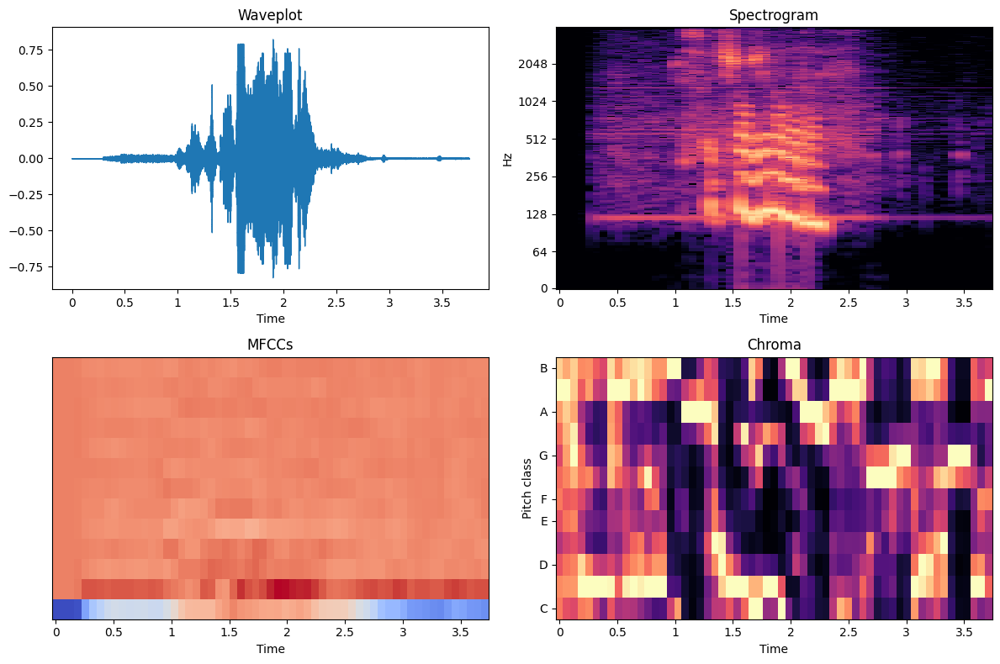

In [111]:
# Convert audio array to float32
french_audio = french_audio.astype(np.float32)

# Compute MFCCs and Chroma
mfccs = librosa.feature.mfcc(y=french_audio, sr=french_sampling_rate, n_mfcc=13)
chroma = librosa.feature.chroma_stft(y=french_audio, sr=french_sampling_rate)

# Plot Waveplot
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
librosa.display.waveshow(french_audio, sr=french_sampling_rate)
plt.title('Waveplot')

# Plot Spectrogram
plt.subplot(2, 2, 2)
D = librosa.amplitude_to_db(np.abs(librosa.stft(french_audio)), ref=np.max)
librosa.display.specshow(D, sr=french_sampling_rate, x_axis='time', y_axis='log')
plt.title('Spectrogram')

# Plot MFCCs
plt.subplot(2, 2, 3)
librosa.display.specshow(mfccs, sr=french_sampling_rate, x_axis='time')
plt.title('MFCCs')

# Plot Chroma
plt.subplot(2, 2, 4)
librosa.display.specshow(chroma, sr=french_sampling_rate, x_axis='time', y_axis='chroma')
plt.title('Chroma')

plt.tight_layout()
plt.show()

In [112]:
# Putar audio
audio_player_french = Audio(data=french_audio, rate=french_sampling_rate)
display(audio_player_french)

## US English

In [113]:
english_dataset = load_dataset("PolyAI/minds14", 'en-US', trust_remote_code=True)['train']

In [114]:
english_audio = english_dataset[0]['audio']['array']
english_sampling_rate = english_dataset[0]['audio']['sampling_rate']

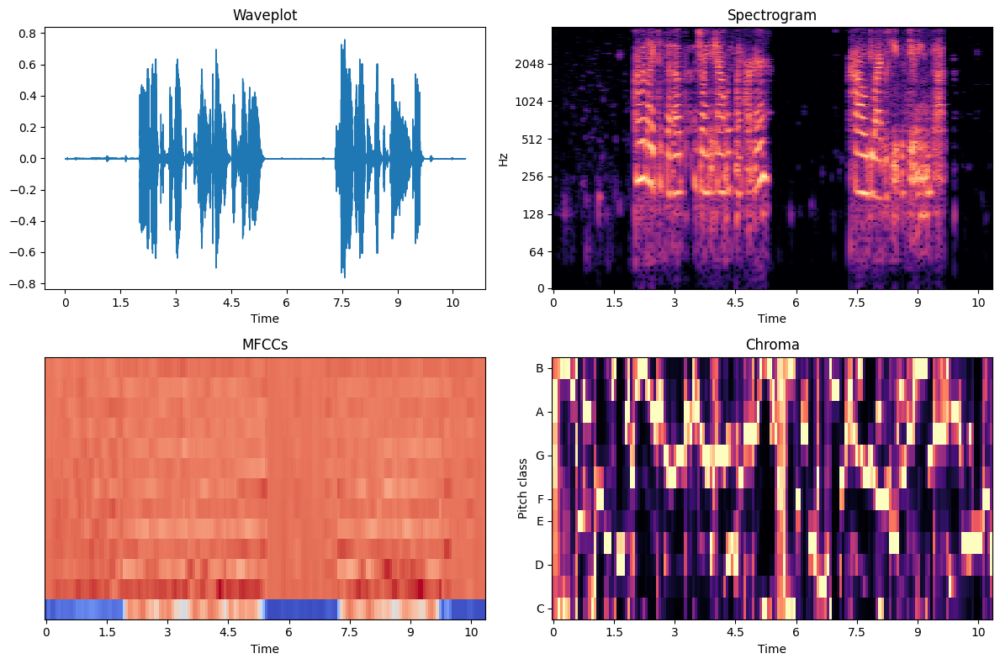

In [115]:
# Convert audio array to float32
english_audio = english_audio.astype(np.float32)

# Compute MFCCs and Chroma
mfccs = librosa.feature.mfcc(y=english_audio, sr=english_sampling_rate, n_mfcc=13)
chroma = librosa.feature.chroma_stft(y=english_audio, sr=english_sampling_rate)

# Plot Waveplot
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
librosa.display.waveshow(english_audio, sr=english_sampling_rate)
plt.title('Waveplot')

# Plot Spectrogram
plt.subplot(2, 2, 2)
D = librosa.amplitude_to_db(np.abs(librosa.stft(english_audio)), ref=np.max)
librosa.display.specshow(D, sr=english_sampling_rate, x_axis='time', y_axis='log')
plt.title('Spectrogram')

# Plot MFCCs
plt.subplot(2, 2, 3)
librosa.display.specshow(mfccs, sr=english_sampling_rate, x_axis='time')
plt.title('MFCCs')

# Plot Chroma
plt.subplot(2, 2, 4)
librosa.display.specshow(chroma, sr=english_sampling_rate, x_axis='time', y_axis='chroma')
plt.title('Chroma')

plt.tight_layout()
plt.show()

In [116]:
# Putar audio
audio_player_english = Audio(data=english_audio, rate=english_sampling_rate)
display(audio_player_english)

## German

In [117]:
german_dataset = load_dataset("PolyAI/minds14", 'de-DE', trust_remote_code=True)['train']

In [118]:
german_audio = german_dataset[0]['audio']['array']
german_sampling_rate = german_dataset[0]['audio']['sampling_rate']

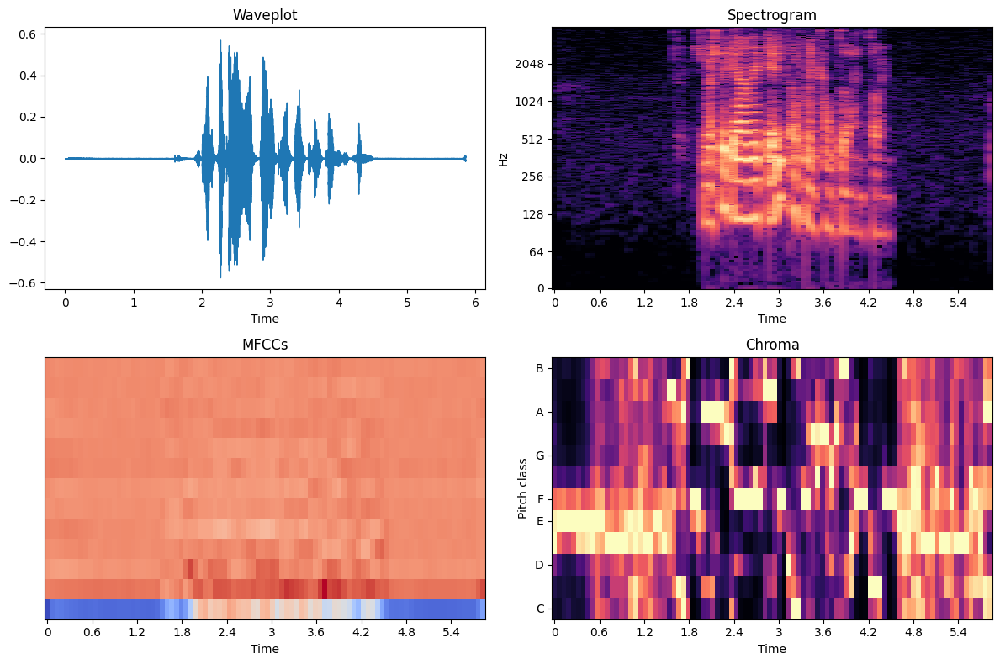

In [119]:
# Convert audio array to float32
german_audio = german_audio.astype(np.float32)

# Compute MFCCs and Chroma
mfccs = librosa.feature.mfcc(y=german_audio, sr=german_sampling_rate, n_mfcc=13)
chroma = librosa.feature.chroma_stft(y=german_audio, sr=german_sampling_rate)

# Plot Waveplot
plt.figure(figsize=(12, 8))

plt.subplot(2, 2, 1)
librosa.display.waveshow(german_audio, sr=german_sampling_rate)
plt.title('Waveplot')

# Plot Spectrogram
plt.subplot(2, 2, 2)
D = librosa.amplitude_to_db(np.abs(librosa.stft(german_audio)), ref=np.max)
librosa.display.specshow(D, sr=german_sampling_rate, x_axis='time', y_axis='log')
plt.title('Spectrogram')

# Plot MFCCs
plt.subplot(2, 2, 3)
librosa.display.specshow(mfccs, sr=german_sampling_rate, x_axis='time')
plt.title('MFCCs')

# Plot Chroma
plt.subplot(2, 2, 4)
librosa.display.specshow(chroma, sr=german_sampling_rate, x_axis='time', y_axis='chroma')
plt.title('Chroma')

plt.tight_layout()
plt.show()

In [120]:
# Putar audio
audio_player_german = Audio(data=german_audio, rate=german_sampling_rate)
display(audio_player_german)